In [5]:
import os
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import configparser
import matplotlib.pyplot as plt
import random

Dataset Class

In [6]:
class SportsMOTDataset(Dataset):
    def __init__(self, data_root, splits_txt_dir, split, transform=None):
        """
        Args:
            data_root (str): Path to the dataset root directory.
            splits_txt_dir (str): Path to the splits_txt directory.
            split (str): One of 'train', 'val', or 'test'.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.data_root = os.path.join(data_root, split)
        self.splits_txt_dir = splits_txt_dir
        self.split = split
        self.transform = transform
        
        # Get list of video names for the split
        self.video_names = self.parse_split_file(split)
        
        # Collect all image paths and corresponding annotation paths (if available)
        self.image_paths = []
        self.annotation_paths = []
        
        for video in self.video_names:
            video_path = os.path.join(self.data_root, video)
            img_dir = os.path.join(video_path, "img1")
            gt_dir = os.path.join(video_path, "gt")
            gt_file = os.path.join(gt_dir, "gt.txt")
            
            if not os.path.exists(img_dir):
                print(f"Image directory {img_dir} does not exist. Skipping video {video}.")
                continue
            
            images = sorted([img for img in os.listdir(img_dir) if img.endswith(('.jpg', '.png'))])
            self.image_paths.extend([os.path.join(img_dir, img) for img in images])
            
            if self.split in ['train', 'val']:
                if os.path.exists(gt_file):
                    self.annotation_paths.extend([gt_file] * len(images))
                else:
                    print(f"Annotation file {gt_file} does not exist for video {video}.")
                    self.annotation_paths.extend([None] * len(images))
            else:
                # For test split, annotations may not be available
                self.annotation_paths.extend([None] * len(images))
        
        print(f"{split.capitalize()} split: {len(self.image_paths)} images found.")
    
    def parse_split_file(self, split_name):
        """
        Parses the split text file to get the list of video names for the given split.
        
        Args:
            split_name (str): One of 'train', 'val', or 'test'.
        
        Returns:
            List[str]: List of video names for the split.
        """
        split_file = os.path.join(self.splits_txt_dir, f"{split_name}.txt")
        if not os.path.exists(split_file):
            raise FileNotFoundError(f"Split file {split_file} does not exist.")
        
        with open(split_file, 'r') as f:
            video_names = [line.strip() for line in f.readlines() if line.strip()]
        return video_names
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        # Load image
        img_path = self.image_paths[idx]
        try:
            image = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return a black image and empty annotations
            image = Image.new("RGB", (1, 1), (0, 0, 0))
            annotations = torch.empty((0, 9), dtype=torch.float32)
            return image, annotations
        
        # Load annotations if available
        ann_path = self.annotation_paths[idx]
        if ann_path:
            annotations = self._load_annotations(ann_path, idx)
        else:
            annotations = np.array([], dtype=np.float32).reshape(0, 9)  # Empty annotations for test
        
        # Apply transformations
        if self.transform:
            image = self.transform(image)
        
        # Convert annotations to tensor if not empty
        if len(annotations) > 0:
            annotations = torch.tensor(annotations, dtype=torch.float32)
        else:
            annotations = torch.empty((0, 9), dtype=torch.float32)
        
        return image, annotations
    
    def _load_annotations(self, ann_path, idx):
        """
        Load annotations for the given image index.
        
        Args:
            ann_path (str): Path to the annotation file.
            idx (int): Index of the image in the dataset.
            
        Returns:
            np.ndarray: Array of annotations for the image.
        """
        annotations = self.parse_gt_file(ann_path)
        
        # Extract frame number from image path
        # Assuming image filenames are zero-padded frame numbers, e.g., 000001.jpg
        frame_number = int(os.path.splitext(os.path.basename(self.image_paths[idx]))[0])
        
        # Filter annotations for the current frame
        frame_annotations = annotations[annotations[:, 0] == frame_number]
        
        return frame_annotations
    
    @staticmethod
    def parse_gt_file(gt_file_path):
        """
        Parses the ground truth annotation file.
        
        Args:
            gt_file_path (str): Path to the gt.txt file.
            
        Returns:
            np.ndarray: Array of annotations with shape (N, 9).
        """
        if not os.path.exists(gt_file_path):
            raise FileNotFoundError(f"Annotation file {gt_file_path} does not exist.")
        
        # Assuming the gt.txt has at least 6 columns: frame, id, x, y, w, h
        # Adjust dtype and delimiter as per your gt.txt format
        annotations = np.loadtxt(gt_file_path, delimiter=",", dtype=np.float32)
        if annotations.ndim == 1:
            annotations = annotations[np.newaxis, :]  # Handle single annotation case
        return annotations


loading and confirming dataloaders 

In [7]:
# Visualization Function
def visualize_sample(image, annotations):
    """
    Visualizes an image and its corresponding annotations (bounding boxes).
    
    Args:
        image (torch.Tensor): Image tensor of shape (3, H, W).
        annotations (torch.Tensor): Tensor of annotations with shape (N, 9).
    """
    # Convert image tensor to numpy array and change shape to (H, W, 3)
    image = image.permute(1, 2, 0).numpy()
    image = (image * np.array([0.229, 0.224, 0.225]) + 
             np.array([0.485, 0.456, 0.406]))  # Reverse normalization
    image = np.clip(image, 0, 1)  # Clip values to [0, 1] for visualization
    
    # Get original image size
    height, width, _ = image.shape
    
    # Plot the image
    plt.figure(figsize=(width / 100, height / 100))  # Adjust figure size based on image size
    plt.imshow(image)
    plt.axis("off")
    
    # Draw bounding boxes from annotations
    for ann in annotations:
        if ann.numel() == 0:
            continue  # Skip if no annotations
        bbox = ann[2:6].numpy()  # Extract bounding box (x, y, w, h)
        x, y, w, h = bbox
        plt.gca().add_patch(plt.Rectangle(
            (x, y), w, h, fill=False, edgecolor="red", linewidth=2
        ))
    plt.show()

# Testing Function
def test_dataloaders(train_loader, val_loader, test_loader, num_samples=2):
    """
    Tests and visualizes samples from the dataloaders.
    
    Args:
        train_loader (DataLoader): Training dataloader.
        val_loader (DataLoader): Validation dataloader.
        test_loader (DataLoader): Test dataloader.
        num_samples (int): Number of samples to visualize from each loader.
    """
    def visualize_from_loader(loader, split_name, num_samples):
        print(f"\nVisualizing samples from the {split_name} loader...")
        for i, (images, annotations) in enumerate(loader):
            if i >= num_samples:
                break
            for j in range(2):
                print(f"\nSample {j + 1} in Batch {i + 1}:")
                print(f"  Image shape: {images[j].shape}")  # (3, H, W)
                print(f"  Annotations shape: {annotations[j].shape}")  # (N, 9)
                visualize_sample(images[j], annotations[j])
    
    visualize_from_loader(train_loader, "train", num_samples)
    visualize_from_loader(val_loader, "validation", num_samples)
    visualize_from_loader(test_loader, "test", num_samples)


def custom_collate_fn(batch):
    """
    Custom collate function to handle batches with variable number of annotations
    and potentially variable image sizes.
    
    Args:
        batch (list): List of tuples (image, annotations).
    
    Returns:
        images (list of torch.Tensor): List of image tensors.
        annotations (list of torch.Tensor): List of annotation tensors.
    """
    images, annotations = zip(*batch)
    return list(images), list(annotations)

# DataLoader Function
def get_dataloaders(data_root, splits_txt_dir, batch_size=32, num_workers=4):
    """
    Prepares train, validation, and test dataloaders with a custom collate function.
    
    Args:
        data_root (str): Path to the dataset root directory.
        splits_txt_dir (str): Path to the splits_txt directory.
        batch_size (int): Batch size for dataloaders.
        num_workers (int): Number of workers for dataloaders.
    
    Returns:
        train_loader, val_loader, test_loader: DataLoader instances.
    """
    # Define transformations without resizing
    transform = transforms.Compose([
        transforms.ToTensor(),  # Convert PIL Image to Tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                             std=[0.229, 0.224, 0.225])  # Normalize
    ])
    
    # Create datasets
    train_dataset = SportsMOTDataset(
        data_root=data_root,
        splits_txt_dir=splits_txt_dir,
        split="train",
        transform=transform
    )
    val_dataset = SportsMOTDataset(
        data_root=data_root,
        splits_txt_dir=splits_txt_dir,
        split="val",
        transform=transform
    )
    test_dataset = SportsMOTDataset(
        data_root=data_root,
        splits_txt_dir=splits_txt_dir,
        split="test",
        transform=transform
    )
    
    # Create dataloaders with the custom collate function
    train_loader = DataLoader(
        train_dataset, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=num_workers,
        collate_fn=custom_collate_fn
    )
    val_loader = DataLoader(
        val_dataset, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=num_workers,
        collate_fn=custom_collate_fn
    )
    test_loader = DataLoader(
        test_dataset, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=num_workers,
        collate_fn=custom_collate_fn
    )
    
    return train_loader, val_loader, test_loader


Train split: 28574 images found.
Val split: 26970 images found.
Test split: 94835 images found.

Visualizing samples from the train loader...

Sample 1 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


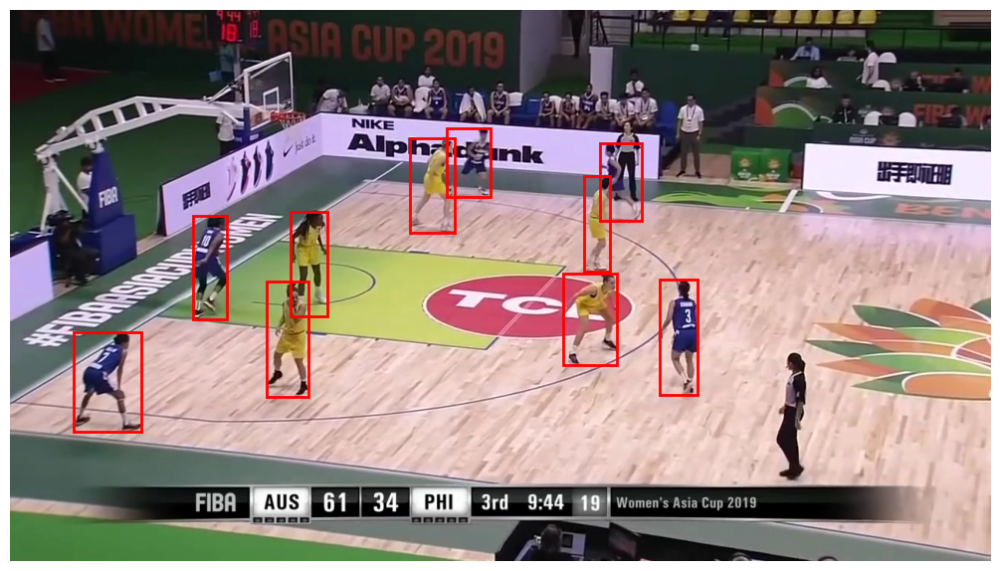


Sample 2 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


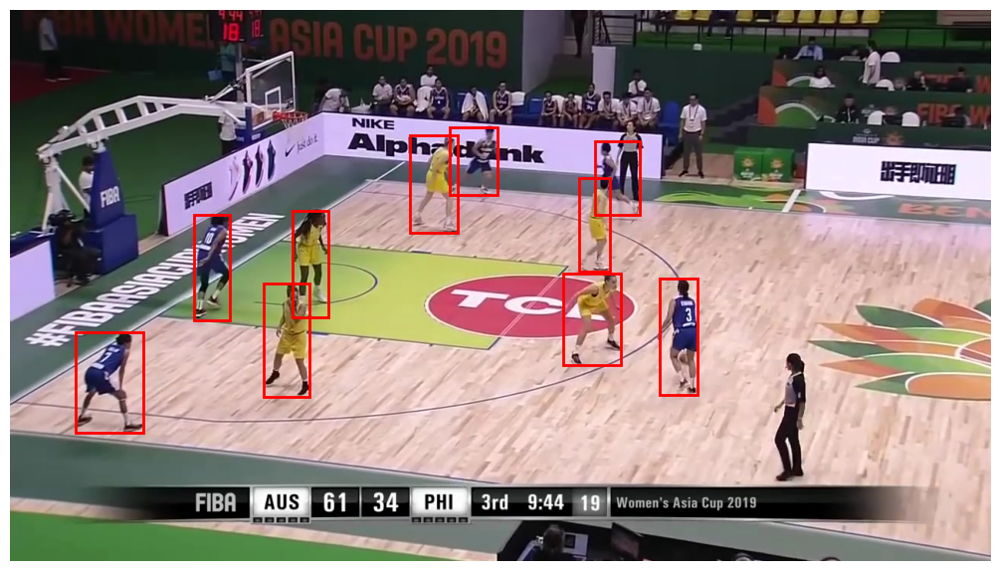


Sample 1 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


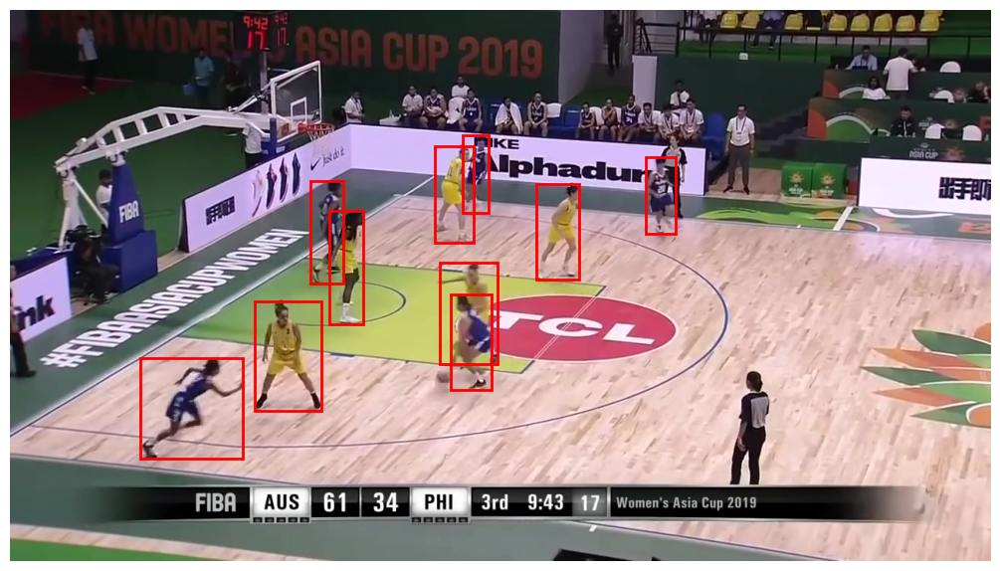


Sample 2 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


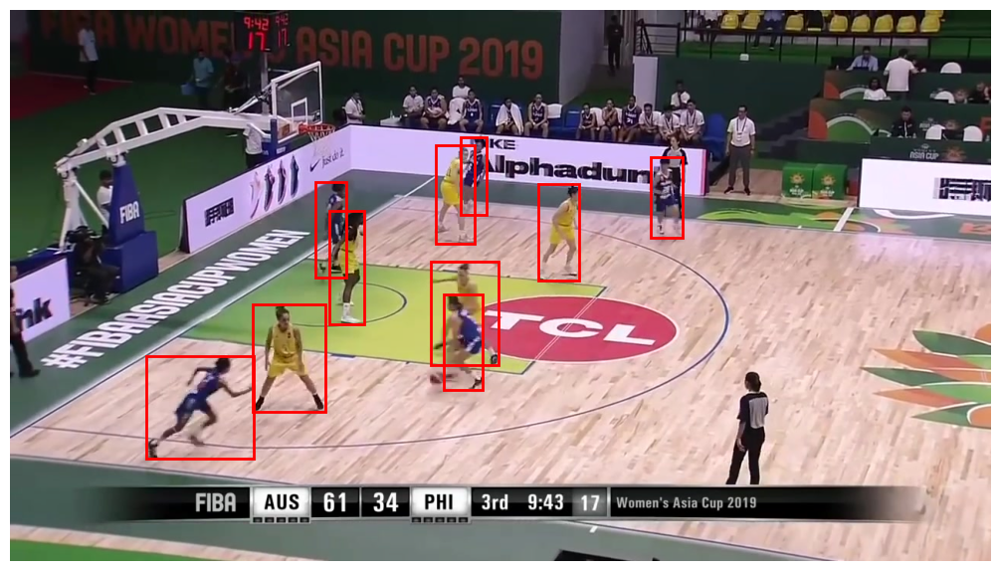


Visualizing samples from the validation loader...

Sample 1 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([8, 9])


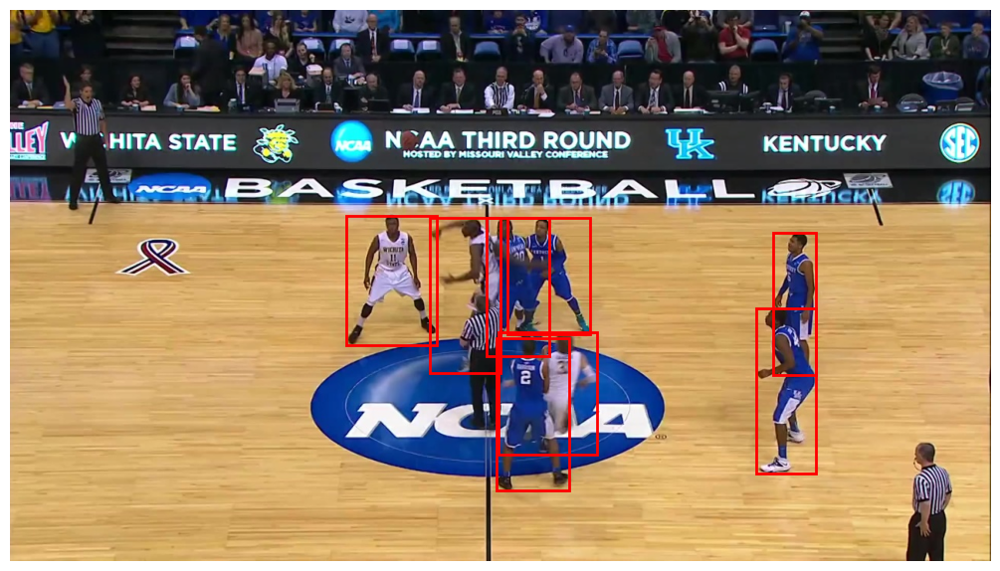


Sample 2 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([9, 9])


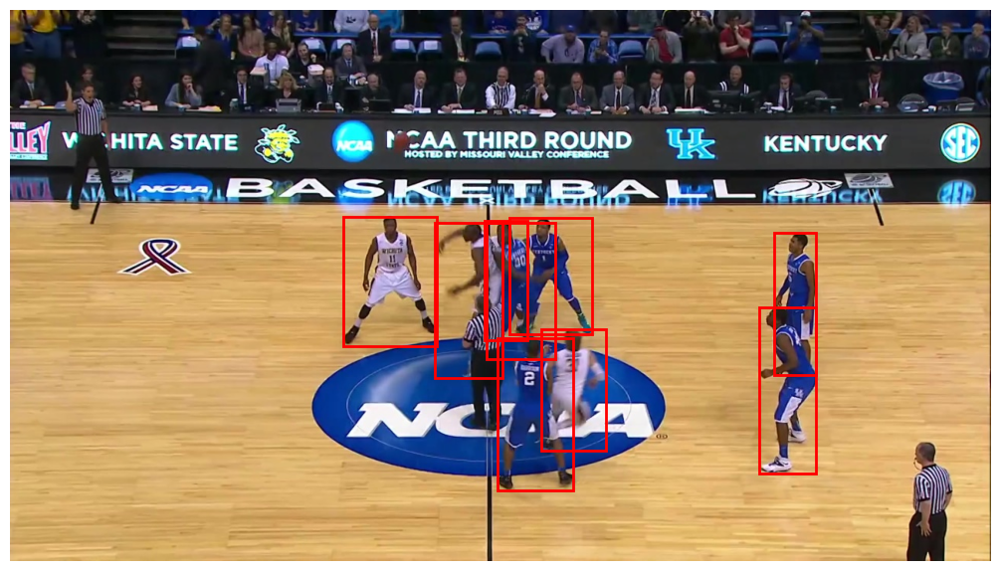


Sample 1 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


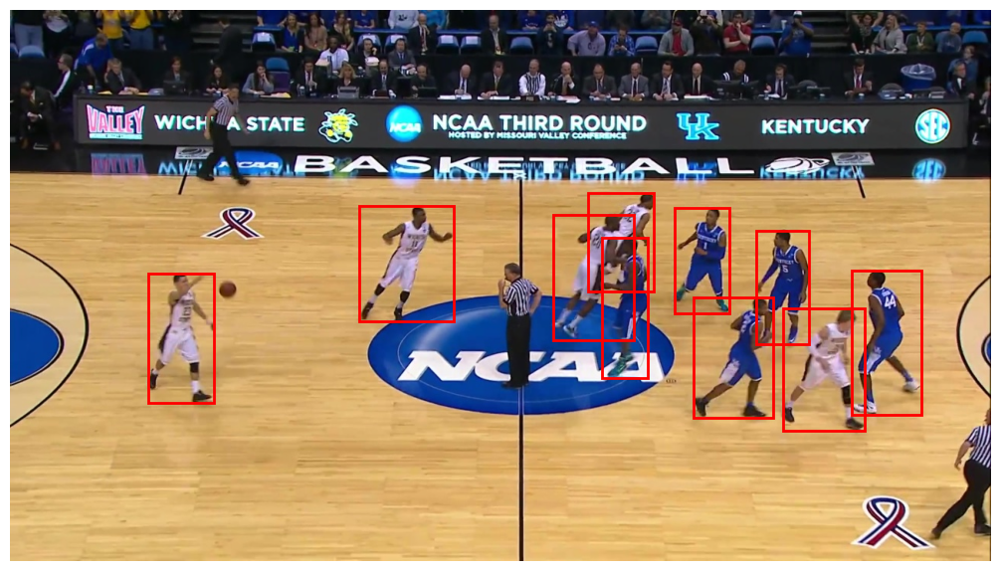


Sample 2 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([10, 9])


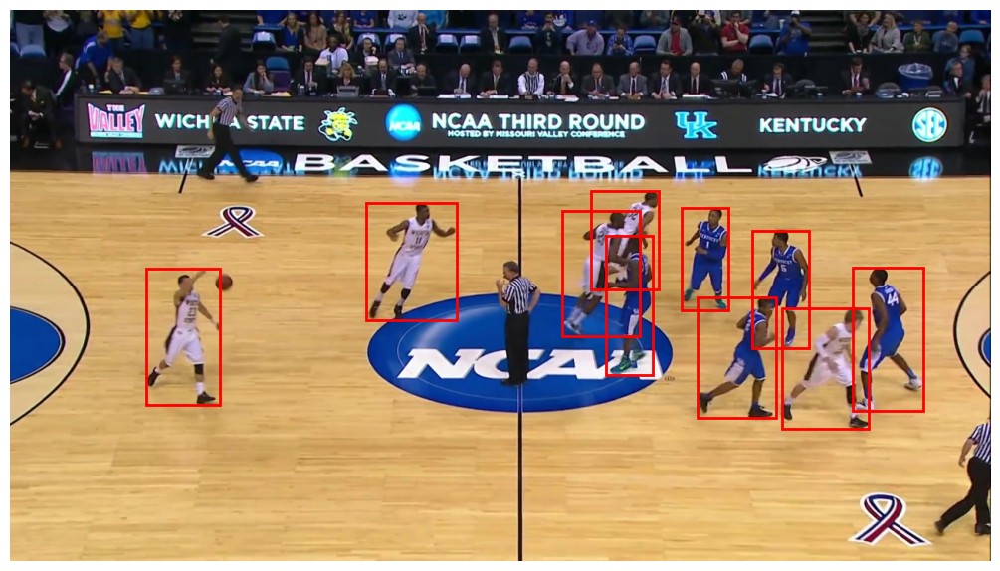


Visualizing samples from the test loader...

Sample 1 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([0, 9])


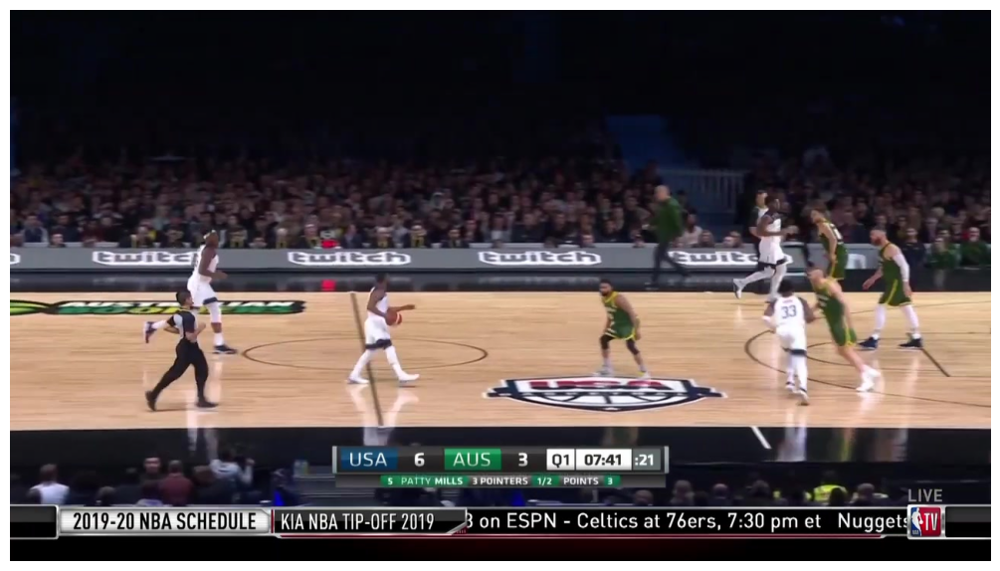


Sample 2 in Batch 1:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([0, 9])


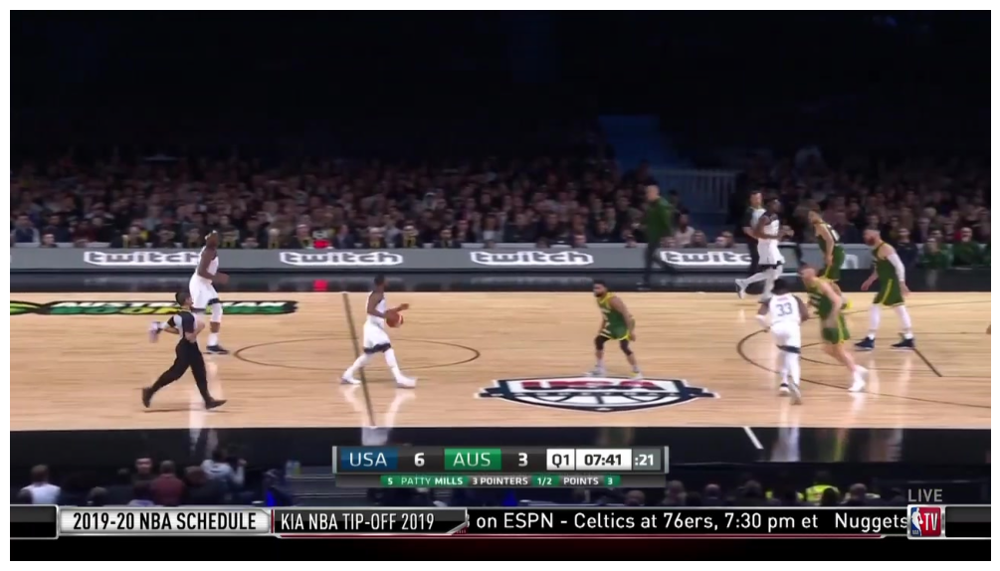


Sample 1 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([0, 9])


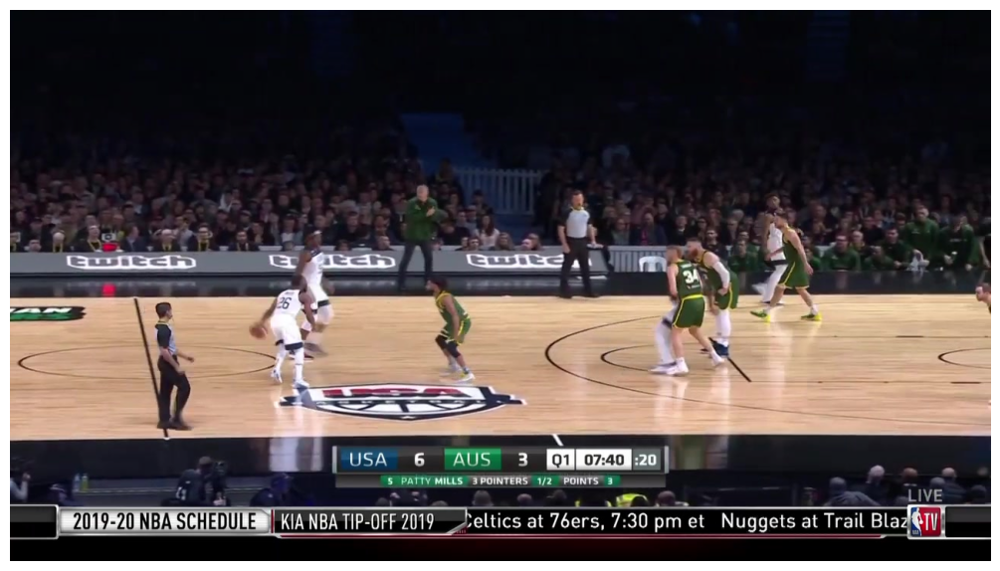


Sample 2 in Batch 2:
  Image shape: torch.Size([3, 720, 1280])
  Annotations shape: torch.Size([0, 9])


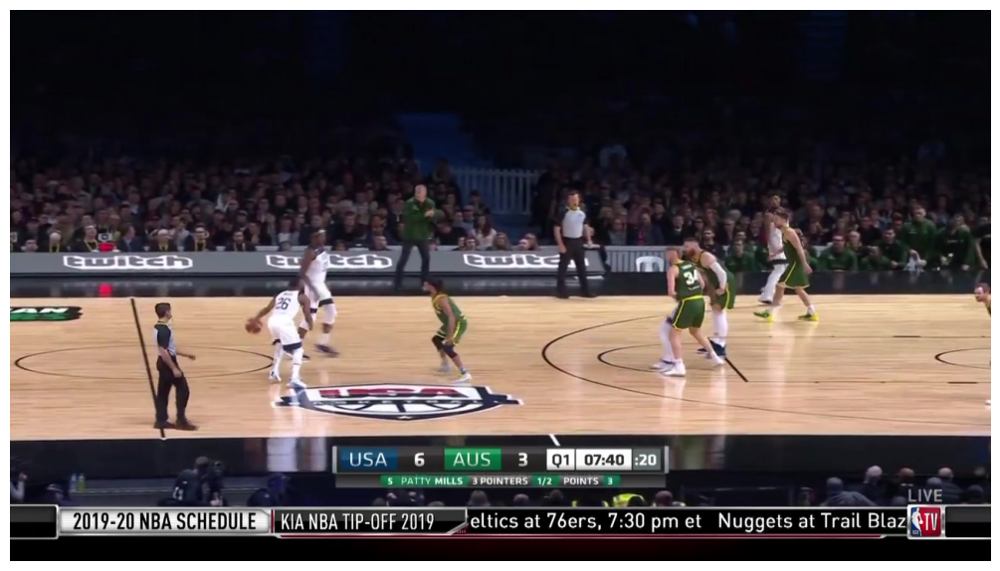

In [8]:
# Define the root directory of your dataset
ROOT = "/kaggle/input/sportsmot/sportsmot_publish"  # Replace with your actual path
    
# Define the directory containing split text files
SPLITS_TXT_DIR = os.path.join(ROOT, "splits_txt")
    
# Create dataloaders
train_loader, val_loader, test_loader = get_dataloaders(
    data_root=os.path.join(ROOT, "dataset"),
    splits_txt_dir=SPLITS_TXT_DIR,
    batch_size=32,
    num_workers=4
)
    
# Test and visualize samples from the dataloaders
test_dataloaders(train_loader, val_loader, test_loader, num_samples=2)
